# Weed Detection using YOLO8 and YOLO11
By
- $Samuel$ $Waweru$ $Kamau$ $(ENM221-0040/2020)$
- $Ray$ $Ngigi$ $Njoroge$ $(ENM221-0283/2020)$

Advised by
- $Ms$ $Grace$ $Wamuti$ 

# 1. Introduction

The YOLO family has evolved significantly to offer different tradeoffs between speed and accuracy that could be relevant for agricultural weed detection. YOLOv5 provides a good baseline with reliable performance and extensive community support, making it a practical choice for initial development. YOLOv7 improved upon this with better accuracy, particularly for small object detection - which could be crucial for identifying young weeds among crops. YOLOv8 introduced significant architectural improvements that enhanced both speed and accuracy, while YOLO-NAS brought neural architecture search to optimize model architecture automatically for specific hardware constraints - particularly useful for deployment on agricultural machinery with limited computational resources. YOLO11, the latest iteration in the Ultralytics YOLO series, represents a significant leap forward in object detection technology. Building upon the strengths of its predecessors, YOLO11 is engineered for enhanced precision and efficiency, making it ideal for demanding computer vision applications. For weed detection specifically, YOLOv8 might offer the best balance, as its improved feature extraction capabilities help distinguish between similar-looking plants while maintaining the real-time performance needed for practical field applications.

Choosing between different YOLO models depends on the specific requirements of your project. If accuracy is the top priority and computational resources are sufficient, **YOLO11** is the superior choice. Its enhanced architecture delivers higher precision, making it ideal for critical applications like medical imaging and security.

However, if speed and versatility are more crucial, or if deployment on lower-powered devices is necessary, **YOLOv8** provides an excellent balance of performance. Its efficient design ensures real-time object detection capabilities across a wide range of applications.


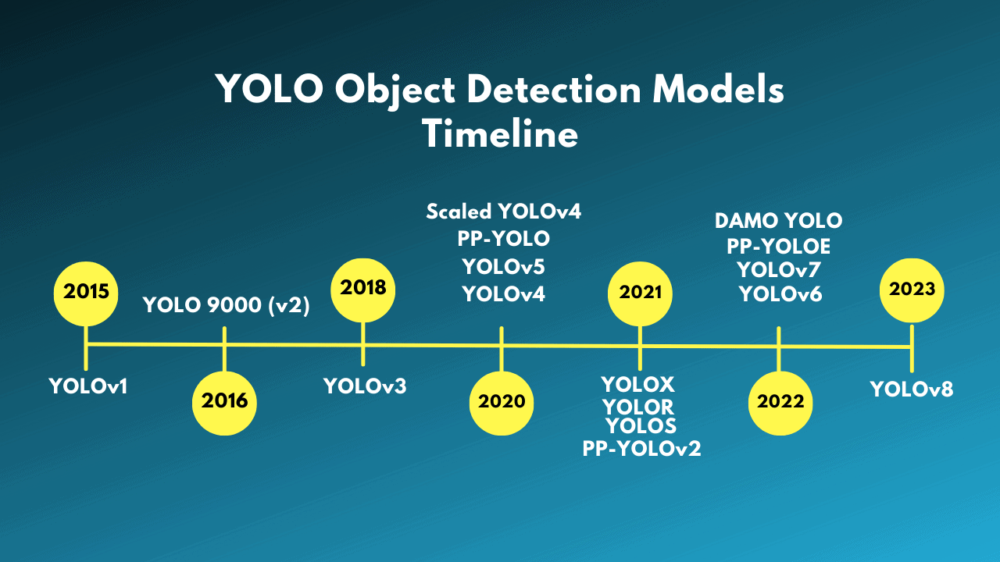

In [1]:
from IPython.display import display
from PIL import Image

image_path = "/kaggle/input/20thupload/yolov8_ultarlytics_image_cover.png"  # Update with your image path
img = Image.open(image_path)
display(img)


 To achieve weed detection, we fine-tune a pre-trained YOLO11 model using a dataset consisting of labeled images of crops and weeds. By training the model with annotated agricultural data, it learns to distinguish between crops and unwanted plants, enabling automated weed control in smart farming systems.


------
# 2. Data Engineering
## 2.1 Data Collection 

The weed dataset was obtained from open source as well as our physical effort across multiple locations and lighting conditions to capture diverse environmental conditions and growth stages. Using a smartphone camera, we gathered over **56** (**Spinach crop, Clover weed**) images. We then augmented the images to obtain additional 5 images from each crop and weed image bringing the number to **305** images.
The images were captured at different times of day and under varying weather conditions to ensure robust model performance in real-world scenarios. 

The Augmentation involved: 
1. Horizontally Flipping the image
2. Vertically Flipping the image
3. Increasing Brightness of the image
4. Rotating the image
5. Applying Gaussian Noise to the image


In [2]:
import os
import shutil
from collections import Counter

# Define paths
original_dataset_path = "/kaggle/input/spinach-clover-yolo-data/Final_Dataset_Spinach_Clover"  # Read-only directory
dataset_path = "/kaggle/working/agri_data"  # Writable directory

# Copy dataset to /kaggle/working/
if not os.path.exists(dataset_path):
    shutil.copytree(original_dataset_path, dataset_path)

# Define class folders
crop_folder = os.path.join(dataset_path, "crop")
weed_folder = os.path.join(dataset_path, "weed")

# Create subfolders if they don’t exist
os.makedirs(crop_folder, exist_ok=True)
os.makedirs(weed_folder, exist_ok=True)

# Process all images and annotation files
for file in os.listdir(dataset_path):
    if file.lower().endswith((".jpeg", ".jpg")):
        # Determine the corresponding annotation file
        annotation_file = file.rsplit(".", 1)[0] + ".txt"
        
        # Construct full paths
        annotation_path = os.path.join(dataset_path, annotation_file)
        image_path = os.path.join(dataset_path, file)
    
        # Ensure both image and annotation files exist
        if os.path.exists(annotation_path):
            with open(annotation_path, "r") as f:
                lines = f.readlines()
            
            # Skip empty annotation files
            if not lines:
                print(f"⚠️ Skipping {file} (empty annotation)")
                continue

            # Count occurrences of each class
            class_labels = [line.split()[0] for line in lines]
            most_common_class = Counter(class_labels).most_common(1)[0][0]  # Get most frequent class

            # Determine destination folder
            if most_common_class == "0":  # Crop
                dest_folder = crop_folder
            elif most_common_class == "1":  # Weed
                dest_folder = weed_folder
            else:
                print(f"⚠️ Skipping {file} (unknown class label: {most_common_class})")
                continue

            # Move both image and annotation files to the determined folder
            shutil.move(image_path, os.path.join(dest_folder, file))
            shutil.move(annotation_path, os.path.join(dest_folder, annotation_file))

# Count the number of images in each category
num_crop_images = len([f for f in os.listdir(crop_folder) if f.lower().endswith((".jpeg", ".jpg"))])
num_weed_images = len([f for f in os.listdir(weed_folder) if f.lower().endswith((".jpeg", ".jpg"))])

# Print the results
print(f"🌱 Crop images: {num_crop_images}")
print(f"🌿 Weed images: {num_weed_images}")
print("✅ Dataset successfully organized into class folders with paired image and annotation files!")


🌱 Crop images: 174
🌿 Weed images: 150
✅ Dataset successfully organized into class folders with paired image and annotation files!


In [3]:
! pip install albumentations

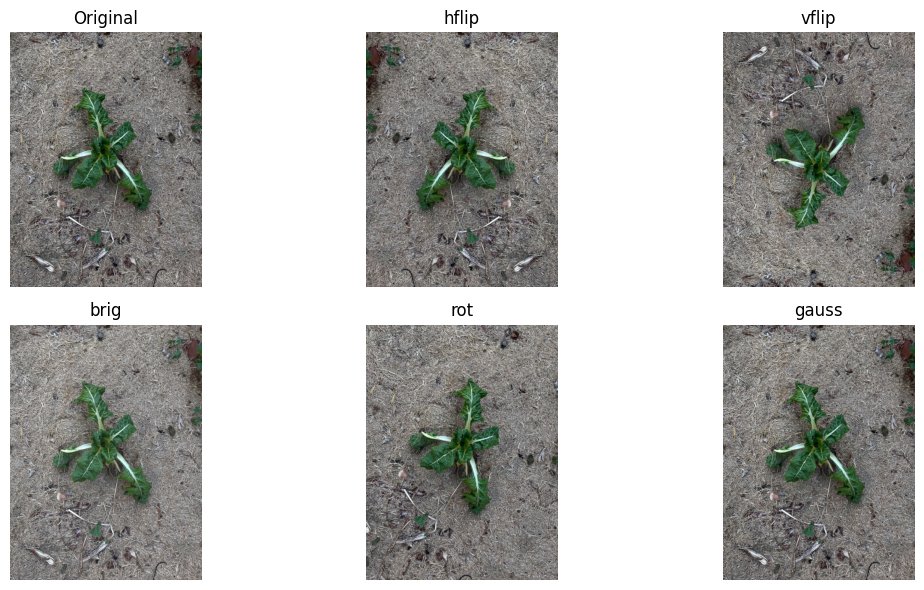

In [6]:
import albumentations as A
import cv2
import os
import matplotlib.pyplot as plt

# Define augmentation functions
augmentations = {
    "hflip": A.HorizontalFlip(p=1.0),
    "vflip": A.VerticalFlip(p=1.0),
    "brig": A.RandomBrightnessContrast(p=1.0),
    "rot": A.Rotate(limit=30, p=1.0),
    "gauss": A.GaussNoise(p=1.0)
}

# Input image path
image_path = "/kaggle/input/spinach-clover-yolo-data/Final_Dataset_Spinach_Clover/spinach11.jpg"
img = cv2.imread(image_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib

# Store images and labels for display
images = [img]
labels = ["Original"]

# Apply each augmentation separately
for aug_name, aug in augmentations.items():
    augmented = aug(image=img)
    augmented_img = augmented['image']
    images.append(augmented_img)
    labels.append(aug_name)

# Plot the images
plt.figure(figsize=(12, 6))
for i, (image, label) in enumerate(zip(images, labels)):
    plt.subplot(2, 3, i + 1)
    plt.imshow(image)
    plt.title(label)
    plt.axis("off")

plt.tight_layout()
plt.show()


Crop Images= 174
Weed Images= 150


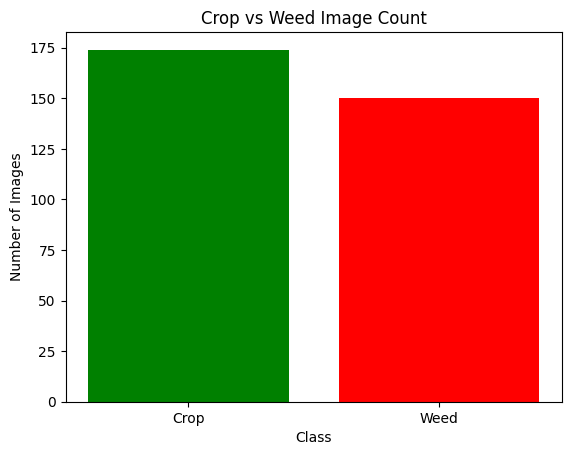

In [8]:
import matplotlib.pyplot as plt

# Define paths
crop_folder = "/kaggle/working/agri_data/crop"
weed_folder = "/kaggle/working/agri_data/weed"

# Count number of files in each folder
num_crop_images = len([f for f in os.listdir(crop_folder) if f.endswith((".jpeg", ".jpg"))])
num_weed_images = len([f for f in os.listdir(weed_folder) if f.endswith((".jpeg", ".jpg"))])

# Create a bar chart
categories = ['Crop', 'Weed']
counts = [num_crop_images, num_weed_images]
print("Crop Images=", num_crop_images)
print("Weed Images=", num_weed_images)

plt.bar(categories, counts, color=['green', 'red'])
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Crop vs Weed Image Count')
plt.show()

Data Engineering also involves a key aspect which is **balancing the dataset**. This involves looking at the size of the data for finetuning, comparing the size of the crop from weeds to prevent any chances of ***overfitting*** and seeing whether more data is required to compensate for any difference i.e. More collection or use of synthetic data.

For this project, we reduced the number of weeds to equal that of crops for at most accuracy and precision.

✅ Balanced dataset: Crop images: 150, Weed images: 150
Crop Images= 150
Weed Images= 150


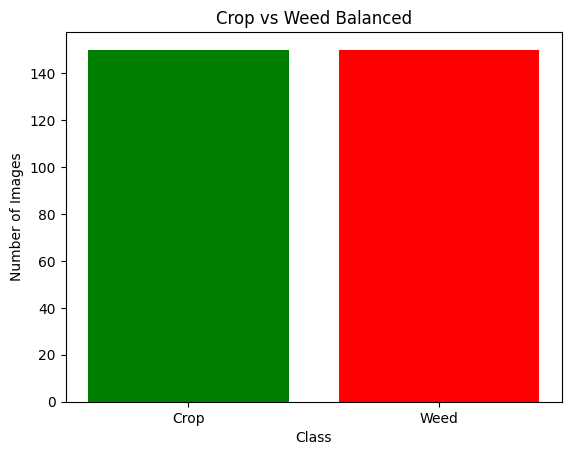

In [9]:
import random
from collections import Counter

# Define paths
dataset_path = "/kaggle/working/agri_data"  # Writable dataset directory
crop_folder = os.path.join(dataset_path, "crop")
weed_folder = os.path.join(dataset_path, "weed")

# Count the number of images in each class
crop_images = [f for f in os.listdir(crop_folder) if f.endswith((".jpeg", ".jpg"))]
weed_images = [f for f in os.listdir(weed_folder) if f.endswith((".jpeg", ".jpg"))]

num_crop = len(crop_images)
num_weed = len(weed_images)

# Find the minimum count between the two classes
min_samples = min(num_crop, num_weed)

# Randomly sample from the larger class
if num_crop > num_weed:
    crop_images = random.sample(crop_images, min_samples)
else:
    weed_images = random.sample(weed_images, min_samples)

# Remove excess images to balance the dataset
for img_folder, img_list in [(crop_folder, crop_images), (weed_folder, weed_images)]:
    for file in os.listdir(img_folder):
        if file.endswith((".jpeg", ".jpg")) and file not in img_list:
            os.remove(os.path.join(img_folder, file))
            annotation_file = file.replace(".jpeg", ".txt").replace(".jpg", ".txt")
            annotation_path = os.path.join(img_folder, annotation_file)
            if os.path.exists(annotation_path):
                os.remove(annotation_path)

# Print final counts
final_crop_count = len([f for f in os.listdir(crop_folder) if f.endswith((".jpeg", ".jpg"))])
final_weed_count = len([f for f in os.listdir(weed_folder) if f.endswith((".jpeg", ".jpg"))])

print(f"✅ Balanced dataset: Crop images: {final_crop_count}, Weed images: {final_weed_count}")
# Create a bar chart
categories = ['Crop', 'Weed']
counts = [final_crop_count, final_weed_count]
print("Crop Images=", final_crop_count)
print("Weed Images=", final_weed_count)

plt.bar(categories, counts, color=['green', 'red'])
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.title('Crop vs Weed Balanced')
plt.show()

## 2.2 Data Anotation

Data annotation is the process of labeling raw data to provide meaningful information that machine learning models can learn from.

Key Components of Data Annotation:

Types of Annotation:
- Image Classification: Labeling entire images with categories (e.g., "weed" or "crop")
- Object Detection: Drawing bounding boxes around objects and labeling them
- Segmentation: Creating pixel-level masks around objects
- Text Annotation: Labeling text for sentiment, intent, or named entities
- Audio Annotation: Transcribing speech or labeling sound events

Common Annotation Tools:

- LabelImg: Popular for object detection tasks
- CVAT: Comprehensive tool for computer vision tasks
- VGG Image Annotator: Web-based tool for image annotation
- Label Studio: Multi-purpose annotation platform

Annotation Best Practices:

- Create clear annotation guidelines
- Maintain consistency across different annotators
- Implement quality control measures
- Document edge cases and special scenarios
- Regular calibration among annotators

Annotation Formats:

- COCO format: Common for object detection
- YOLO format: Specific to YOLO models
- Pascal VOC: Standard XML format
- Custom JSON/CSV formats

For this project we used the ,**CVAT** Web application to create bounding areas for the weeds and crops. Then, the annotated images were saved in a Yolo format, i.e., an image file (jpeg) and its associated text file (txt extension).


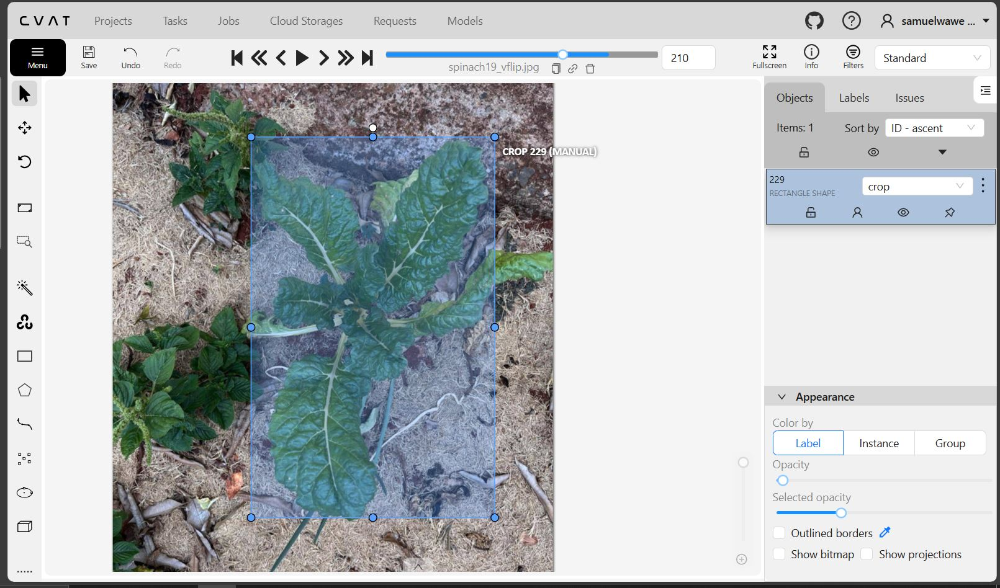

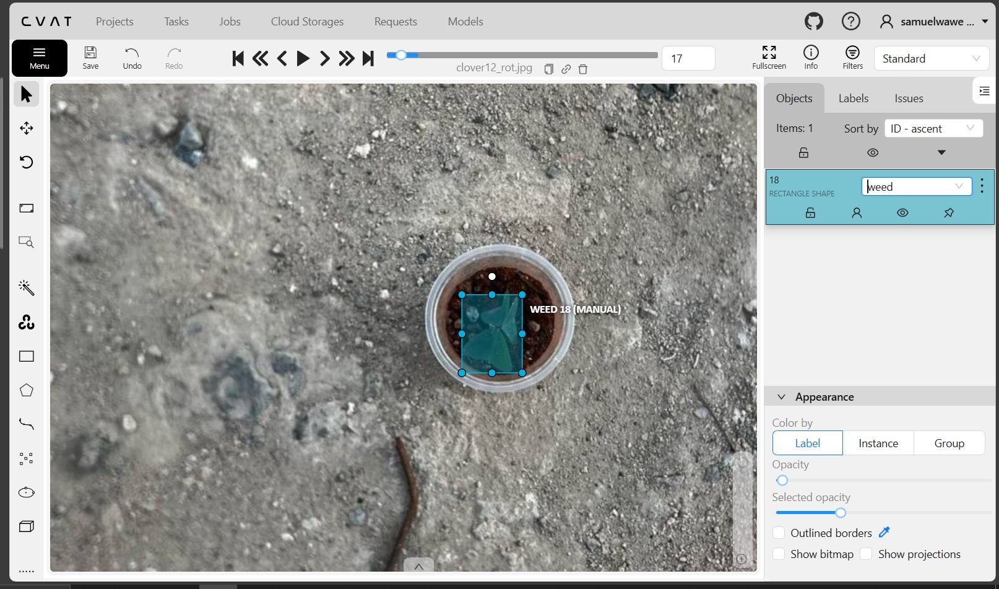

In [11]:
from IPython.display import display
from PIL import Image
image_path1 = "/kaggle/input/anotation-spinach-crop/anotation_crop.JPG"  # Update with your image path
image_path2 = "/kaggle/input/anotation-spinach-crop/anotation.JPG"  # Update with your image path
img1 = Image.open(image_path1)
display(img1)
img2 = Image.open(image_path2)
display(img2)

## 2.3 Data Splitting

Finally, splitting the data into **Training (80%), Validation (10%) and Testing (10%)**

In [12]:
! pip install split-folders

In [13]:
import os
import shutil
import random

# Define paths
dataset_path = "/kaggle/working/agri_data"  # Your original dataset path
split_path = "/kaggle/working/agri_data_split"  # The path where your split data will go

# Create directories if they don’t exist
for split in ['train', 'val', 'test']:
    os.makedirs(os.path.join(split_path, split), exist_ok=True)

# Get all image files for both crop and weed classes
all_image_files = []
for folder in ['crop', 'weed']:
    folder_path = os.path.join(dataset_path, folder)
    image_files = [os.path.join(folder, f) for f in os.listdir(folder_path) if f.endswith(".jpg")]
    all_image_files.extend(image_files)

# Shuffle the image files randomly
random.shuffle(all_image_files)

# Calculate split indices
total_files = len(all_image_files)
train_end = int(0.8 * total_files)
val_end = train_end + int(0.1 * total_files)

# Split the data into train, val, and test
train_files = all_image_files[:train_end]
val_files = all_image_files[train_end:val_end]
test_files = all_image_files[val_end:]

# Function to move both image and annotation files
def move_files(files, split_folder):
    for file in files:
        # Move the image file
        image_src = os.path.join(dataset_path, file)
        image_dst = os.path.join(split_path, split_folder, os.path.basename(file))
        shutil.move(image_src, image_dst)

        # Move the corresponding annotation file
        annotation_file = file.replace(".jpg", ".txt")
        annotation_src = os.path.join(dataset_path, annotation_file)
        if os.path.exists(annotation_src):  # Ensure the annotation file exists
            annotation_dst = os.path.join(split_path, split_folder, os.path.basename(annotation_file))
            shutil.move(annotation_src, annotation_dst)

# Move the files to the appropriate directories
move_files(train_files, 'train')
move_files(val_files, 'val')
move_files(test_files, 'test')

print("✅ Dataset successfully split into train, val, and test folders with annotations!")


✅ Dataset successfully split into train, val, and test folders with annotations!


[240, 30, 30]


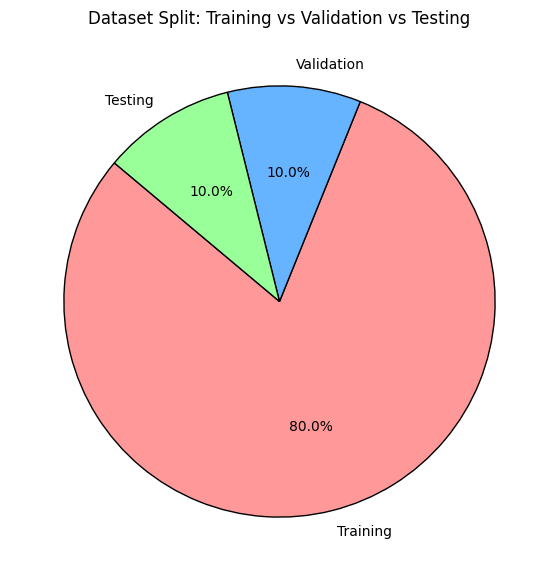

In [14]:
# Define dataset sizes
train_size = len(train_files)
val_size = len(val_files)
test_size = len(test_files)

# Labels and sizes
labels = ['Training', 'Validation', 'Testing']
sizes = [train_size, val_size, test_size]
colors = ['#ff9999','#66b3ff','#99ff99']  # Colors for each section
print(sizes)
# Create pie chart
plt.figure(figsize=(7, 7))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=140, wedgeprops={'edgecolor': 'black'})

# Title and display
plt.title("Dataset Split: Training vs Validation vs Testing")
plt.show()

---
# 3. Fine-tuning the YoloV11 Model

Fine-tuning a YOLOv11 model involves training it on a custom dataset while leveraging pre-trained weights to improve performance on a specific task, such as weed detection. 

The fine-tuning Machine Learning process involves downloading the Ultralytics YOLOv8 repository and install the required dependencies using pip install ultralytics. Then initialize the model with pre-trained weights, typically yolov11n.pt or another variant, and begin training using the command yolo train model=yolov11n.pt data=dataset.yaml epochs=60 imgsz=640. This is where **transfer learning** occurs, as the model reuses pre-trained weights instead of starting from scratch. The lower layers of the model remain mostly unchanged because they capture general features like edges and textures, while the middle and upper layers are fine-tuned to adapt to the new dataset, learning the specific characteristics of objects like weeds. The final detection layers are updated to optimize bounding box predictions and class labels based on the new data.

During training, the model optimizes detection accuracy by adjusting bounding boxes and confidence scores while logging progress in real time. By leveraging transfer learning, the model can specialize in detecting objects in your dataset while benefiting from the knowledge it gained from pre-training on large-scale datasets, leading to faster training and improved accuracy.

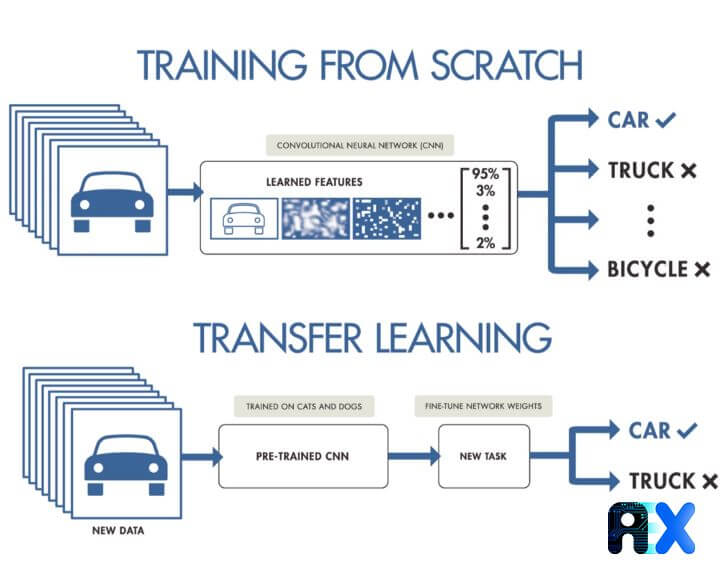

In [15]:
image_path = "/kaggle/input/20thupload/Overview-of-the-transfer-learning-process.jpg"  # Update with your image path
img = Image.open(image_path)
display(img)


In [16]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.8/921.8 kB 16.9 MB/s eta 0:00:00a 0:00:01


In [17]:
from ultralytics import YOLO
import torch
import cv2

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [18]:
# Load a COCO-pretrained YOLOv8n model
model = YOLO("yolo11n.pt")

#config.yaml
#path: C:\Users\hp\OneDrive\Documents\5th_Year\Weed_Detector\agri_data
#train: data
#val: data
#test:test

# classes
#names:
#  0: crop
#  1: weed


100%|██████████| 5.35M/5.35M [00:00<00:00, 75.4MB/s]


In [19]:
# Training the model
train_results = model.train(
    data="/kaggle/input/updated/config.yaml",  # path to dataset YAML
    epochs=60  # number of training epochs
    )



Ultralytics 8.3.79 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/input/updated/config.yaml, epochs=60, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, sho

100%|██████████| 755k/755k [00:00<00:00, 16.7MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/agri_data_split/train... 240 images, 0 backgrounds, 0 corrupt: 100%|██████████| 240/240 [00:00<00:00, 1140.51it/s]

train: New cache created: /kaggle/working/agri_data_split/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/agri_data_split/val... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<00:00, 1113.96it/s]

val: New cache created: /kaggle/working/agri_data_split/val.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/60      2.22G      2.115      4.132      2.048         38        640: 100%|██████████| 15/15 [00:04<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.63s/it]

                   all         30         32    0.00219      0.594      0.204     0.0862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/60       2.2G      1.848      3.134      1.722         37        640: 100%|██████████| 15/15 [00:03<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


                   all         30         32    0.00235      0.688      0.285      0.148

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/60       2.2G      1.839      2.748      1.731         45        640: 100%|██████████| 15/15 [00:03<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.62it/s]

                   all         30         32      0.677      0.312      0.287      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/60       2.2G      1.783      2.507      1.674         27        640: 100%|██████████| 15/15 [00:03<00:00,  4.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         30         32      0.829      0.242      0.327      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/60       2.2G      1.707      2.449      1.665         45        640: 100%|██████████| 15/15 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.74it/s]

                   all         30         32          1       0.15      0.257      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/60       2.2G       1.73      2.248      1.703         29        640: 100%|██████████| 15/15 [00:02<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         30         32      0.901      0.344      0.453      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/60       2.2G      1.785      2.303      1.642         34        640: 100%|██████████| 15/15 [00:02<00:00,  5.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

                   all         30         32      0.618      0.496      0.787       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/60       2.2G      1.723      1.975      1.591         33        640: 100%|██████████| 15/15 [00:03<00:00,  4.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

                   all         30         32      0.483      0.808      0.541      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/60       2.2G       1.82      2.022      1.686         31        640: 100%|██████████| 15/15 [00:03<00:00,  4.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

                   all         30         32       0.48      0.836       0.62      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/60       2.2G      1.749       1.92      1.643         30        640: 100%|██████████| 15/15 [00:02<00:00,  5.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         30         32       0.57      0.862      0.827      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/60       2.2G      1.699      1.785      1.618         37        640: 100%|██████████| 15/15 [00:02<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

                   all         30         32      0.594      0.885      0.784      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/60       2.2G      1.618      1.562      1.505         34        640: 100%|██████████| 15/15 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]

                   all         30         32      0.745      0.729       0.82      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/60       2.2G      1.654      1.644      1.516         37        640: 100%|██████████| 15/15 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]

                   all         30         32      0.919      0.898      0.964      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/60       2.2G      1.659      1.553      1.549         33        640: 100%|██████████| 15/15 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


                   all         30         32      0.938      0.919      0.955      0.568

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/60       2.2G       1.57      1.442        1.5         37        640: 100%|██████████| 15/15 [00:03<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]

                   all         30         32      0.869      0.875       0.92      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/60       2.2G      1.641      1.433      1.499         28        640: 100%|██████████| 15/15 [00:03<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


                   all         30         32      0.886      0.797      0.921      0.507

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/60       2.2G      1.636       1.42      1.508         38        640: 100%|██████████| 15/15 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         30         32      0.912      0.804      0.932      0.533

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/60       2.2G      1.553      1.379      1.489         31        640: 100%|██████████| 15/15 [00:02<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


                   all         30         32      0.991      0.915      0.983      0.588

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/60       2.2G      1.426      1.261      1.405         34        640: 100%|██████████| 15/15 [00:02<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

                   all         30         32      0.937      0.894      0.944      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/60       2.2G      1.501      1.286      1.461         26        640: 100%|██████████| 15/15 [00:02<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


                   all         30         32      0.928      0.988      0.995      0.591

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/60       2.2G      1.465      1.202      1.414         44        640: 100%|██████████| 15/15 [00:03<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]

                   all         30         32      0.953      0.964      0.986      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/60       2.2G      1.471      1.176      1.386         33        640: 100%|██████████| 15/15 [00:02<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

                   all         30         32      0.985      0.992      0.995      0.656



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/60       2.2G       1.44       1.17      1.371         31        640: 100%|██████████| 15/15 [00:02<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


                   all         30         32      0.986      0.906       0.94      0.576

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/60       2.2G      1.449      1.166      1.411         35        640: 100%|██████████| 15/15 [00:02<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

                   all         30         32      0.908          1       0.99       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/60       2.2G      1.425      1.113      1.362         33        640: 100%|██████████| 15/15 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         30         32      0.908      0.993      0.987      0.663

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/60       2.2G      1.414      1.075      1.362         41        640: 100%|██████████| 15/15 [00:03<00:00,  4.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]

                   all         30         32      0.903          1      0.991      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/60       2.2G        1.4      1.051      1.344         33        640: 100%|██████████| 15/15 [00:02<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]

                   all         30         32      0.965      0.999      0.995      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/60       2.2G      1.389       1.07       1.38         34        640: 100%|██████████| 15/15 [00:02<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

                   all         30         32      0.947          1      0.986      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/60       2.2G      1.373      1.055      1.307         35        640: 100%|██████████| 15/15 [00:03<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


                   all         30         32      0.946      0.993      0.988      0.648

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/60       2.2G      1.396      1.051      1.329         38        640: 100%|██████████| 15/15 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]

                   all         30         32      0.979      0.982      0.995      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/60       2.2G      1.385      1.003      1.335         31        640: 100%|██████████| 15/15 [00:03<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


                   all         30         32      0.955      0.999      0.995      0.645

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/60       2.2G      1.359      0.956      1.351         27        640: 100%|██████████| 15/15 [00:03<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


                   all         30         32      0.965      0.998      0.993      0.667

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/60       2.2G      1.316     0.9071      1.264         30        640: 100%|██████████| 15/15 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

                   all         30         32      0.933      0.969      0.992      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/60       2.2G      1.299      0.932      1.337         33        640: 100%|██████████| 15/15 [00:02<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.45it/s]

                   all         30         32      0.946      0.995      0.995      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/60       2.2G      1.292     0.9307      1.302         28        640: 100%|██████████| 15/15 [00:02<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]

                   all         30         32      0.981      0.998      0.995      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/60       2.2G      1.338     0.9189      1.313         38        640: 100%|██████████| 15/15 [00:02<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

                   all         30         32      0.985          1      0.995      0.717



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/60       2.2G      1.224     0.8486      1.219         32        640: 100%|██████████| 15/15 [00:03<00:00,  4.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

                   all         30         32      0.952          1      0.995      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/60       2.2G      1.263     0.9181      1.271         42        640: 100%|██████████| 15/15 [00:02<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

                   all         30         32      0.938          1      0.995      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/60       2.2G       1.27     0.8535       1.28         34        640: 100%|██████████| 15/15 [00:02<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]

                   all         30         32      0.939          1      0.995      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/60       2.2G      1.222     0.8478      1.274         41        640: 100%|██████████| 15/15 [00:03<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.65it/s]

                   all         30         32      0.934          1      0.991      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/60       2.2G      1.259     0.8414      1.253         35        640: 100%|██████████| 15/15 [00:03<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


                   all         30         32       0.96          1      0.991      0.716

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/60       2.2G      1.226      0.843      1.249         32        640: 100%|██████████| 15/15 [00:02<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.73it/s]

                   all         30         32      0.938          1      0.995      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/60       2.2G      1.225      0.791      1.259         35        640: 100%|██████████| 15/15 [00:02<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]

                   all         30         32       0.93          1      0.995      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/60       2.2G      1.244     0.8352      1.279         29        640: 100%|██████████| 15/15 [00:03<00:00,  4.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]

                   all         30         32      0.922          1      0.995      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/60       2.2G      1.238      0.838      1.281         35        640: 100%|██████████| 15/15 [00:03<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]

                   all         30         32      0.939          1      0.995       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/60       2.2G      1.275     0.8339       1.27         30        640: 100%|██████████| 15/15 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]

                   all         30         32      0.989          1      0.995        0.7



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/60       2.2G      1.205     0.8143      1.222         31        640: 100%|██████████| 15/15 [00:02<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         30         32       0.99          1      0.995      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/60       2.2G      1.215     0.8048      1.244         31        640: 100%|██████████| 15/15 [00:03<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


                   all         30         32      0.992          1      0.995      0.728

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/60       2.2G      1.171     0.7595      1.224         33        640: 100%|██████████| 15/15 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]

                   all         30         32      0.989          1      0.995      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/60       2.2G      1.205     0.8494      1.285         33        640: 100%|██████████| 15/15 [00:02<00:00,  5.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]

                   all         30         32      0.965          1      0.995      0.714


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/60       2.2G      1.083     0.6958       1.18         17        640: 100%|██████████| 15/15 [00:04<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.46it/s]

                   all         30         32      0.966          1      0.995      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/60       2.2G      1.116     0.7095       1.15         17        640: 100%|██████████| 15/15 [00:03<00:00,  4.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]

                   all         30         32      0.965          1      0.993      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/60       2.2G      1.131     0.6845       1.21         17        640: 100%|██████████| 15/15 [00:02<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]

                   all         30         32      0.965          1      0.993      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/60       2.2G      1.103     0.6764      1.201         17        640: 100%|██████████| 15/15 [00:03<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


                   all         30         32      0.962          1      0.993      0.701

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/60       2.2G       1.08     0.6397      1.152         16        640: 100%|██████████| 15/15 [00:03<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.29it/s]

                   all         30         32      0.943          1      0.995      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/60       2.2G      1.073     0.6399      1.187         19        640: 100%|██████████| 15/15 [00:03<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.86it/s]

                   all         30         32      0.943          1      0.995      0.722



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/60       2.2G      1.002     0.6175      1.124         16        640: 100%|██████████| 15/15 [00:02<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

                   all         30         32      0.942          1      0.995      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/60       2.2G      1.065      0.622      1.137         16        640: 100%|██████████| 15/15 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


                   all         30         32      0.943          1      0.993      0.711

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/60       2.2G      1.029     0.5955      1.175         18        640: 100%|██████████| 15/15 [00:02<00:00,  5.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]

                   all         30         32      0.943          1      0.993      0.701



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/60       2.2G     0.9995     0.6193      1.145         17        640: 100%|██████████| 15/15 [00:02<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]

                   all         30         32      0.943          1      0.995      0.726



60 epochs completed in 0.072 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.79 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


                   all         30         32      0.965          1      0.993      0.733
                  crop         14         16      0.936          1      0.991      0.767
                  weed         16         16      0.995          1      0.995      0.699


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 1.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train


---
# Model Evaluation Metrics

### 1. F1 Score Curve (F1_curve.png): 
This curve represents the F1 score across various thresholds. Interpreting this curve can offer insights into the model's balance between false positives and false negatives over different thresholds.

### 2. Precision-Recall Curve (PR_curve.png): 
An integral visualization for any classification problem, this curve showcases the trade-offs between precision and recall at varied thresholds. It becomes especially significant when dealing with imbalanced classes.

### 3. Precision Curve (P_curve.png):
A graphical representation of precision values at different thresholds. This curve helps in understanding how precision varies as the threshold changes.

### 4. Recall Curve (R_curve.png):
Correspondingly, this graph illustrates how the recall values change across different thresholds.

### 5. Confusion Matrix (confusion_matrix.png):
The confusion matrix provides a detailed view of the outcomes, showcasing the counts of true positives, true negatives, false positives, and false negatives for each class.

### 6. Normalized Confusion Matrix (confusion_matrix_normalized.png):
This visualization is a normalized version of the confusion matrix. It represents the data in proportions rather than raw counts. This format makes it simpler to compare the performance across classes.

### 7. Validation Batch Labels (val_batchX_labels.jpg):
These images depict the ground truth labels for distinct batches from the validation dataset. They provide a clear picture of what the objects are and their respective locations as per the dataset.

### 8. Validation Batch Predictions (val_batchX_pred.jpg):
Contrasting the label images, these visuals display the predictions made by the YOLO11 model for the respective batches. By comparing these to the label images, you can easily assess how well the model detects and classifies objects visually.

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Evaluate on test set
metrics = model.val(data="/kaggle/input/updated/config.yaml", split="test")

# Extract key metrics
mAP50 = metrics.box.map50  # mAP@0.5
mAP5095 = metrics.box.map  # mAP@0.5:0.95
precision = metrics.box.mp  # Mean Precision
recall = metrics.box.mr  # Mean Recall
f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

# Print results
print(f"🔹 mAP@0.5: {mAP50:.4f}")
print(f"🔹 mAP@0.5:0.95: {mAP5095:.4f}")
print(f"🔹 Precision: {precision:.4f}")
print(f"🔹 Recall: {recall:.4f}")
print(f"🔹 F1-score: {f1_score:.4f}")

print(dir(metrics.box))  # List all available attributes



Ultralytics 8.3.79 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /kaggle/working/agri_data_split/test.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.93it/s]


                   all         30         31      0.995          1      0.995      0.678
                  crop         12         13      0.993          1      0.995      0.695
                  weed         18         18      0.996          1      0.995       0.66


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 2.6ms preprocess, 3.9ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train3
🔹 mAP@0.5: 0.9950
🔹 mAP@0.5:0.95: 0.6776
🔹 Precision: 0.9947
🔹 Recall: 1.0000
🔹 F1-score: 0.9974
['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', 'all_ap', 'ap', 'ap50', 'ap_class_index', 'class_result', 'curves', 'curves_results', 'f1', 'f1_curve', 'fitness', 'map', 'map50', 'map75', 'maps', 'mean_results', 'mp', 'mr', 'nc', 'p', 'p_curve', 'prec_values', 'px', 'r', 'r_curve', 'update']


### Interpretation of Results
It's important to understand the metrics. Here's what some of the commonly observed lower scores might suggest:


1. Low mAP: detect the model may need general refinements. 
2. Low IoU: The model might struggle. This indicates to pinpoint objects accurately. Different bounding box methods could help.
4. Low Precision: The model may detect too many non-existent objects. Adjusting confidence thresholds might reduce this.
6. Low Recall: The model could be missing real objects. Improving feature extraction or using more data might help.
7. Imbalanced F1 Score: There's a disparity between precision and recall.
8. Class-specific AP: Low scores here can highlight classes the model struggles with.

**Key Performance Metrics**
1. mAP@0.5: 99.50% → Very high accuracy at an IoU threshold of 0.5. This means the model is detecting objects effectively at a relaxed IoU threshold.
2. mAP@0.5:0.95: 67.76% → This score is lower because it averages over multiple IoU thresholds (0.5 to 0.95). It suggests the model’s localization precision can be improved.
3. Precision: 99.47% → Very high precision means few false positives. The model rarely predicts a weed/crop when there isn't one.
4. Recall: 100.00% → The model is capturing all relevant objects (no false negatives).
5. F1-Score: 99.74% → A great balance between precision and recall.


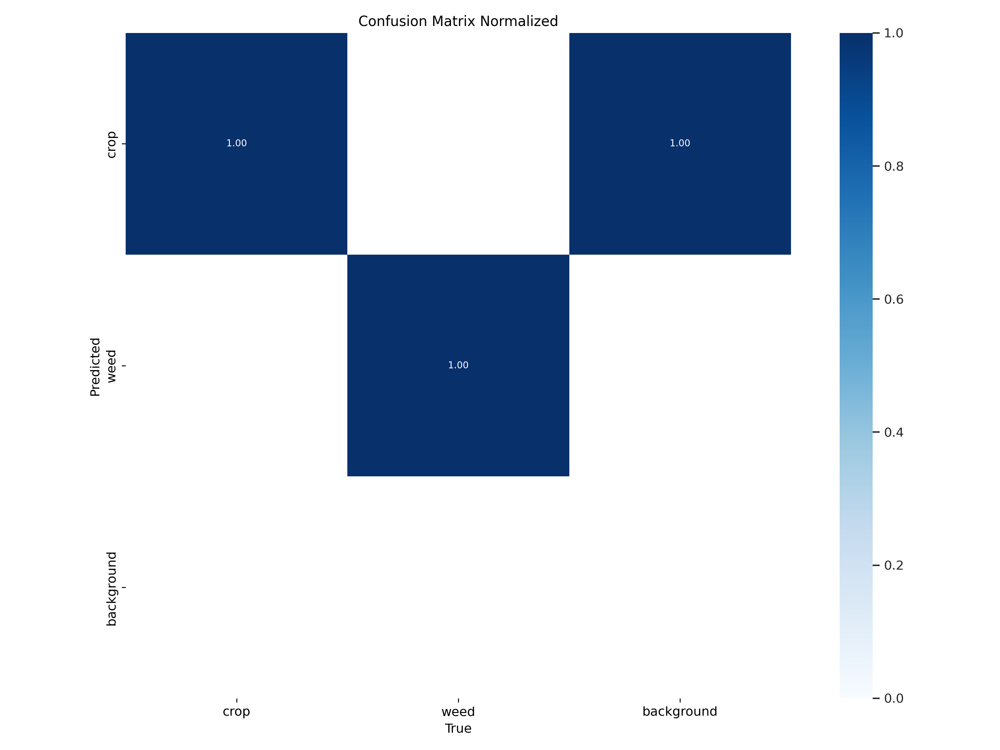

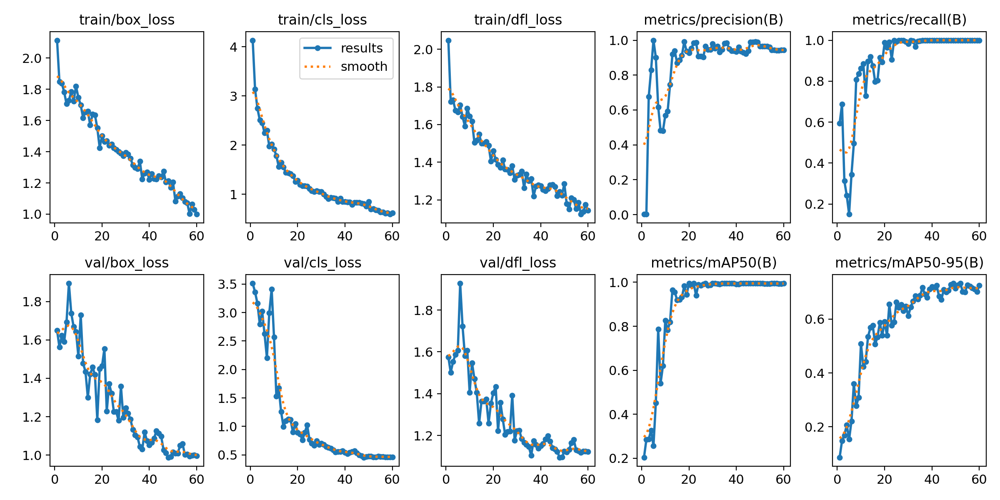

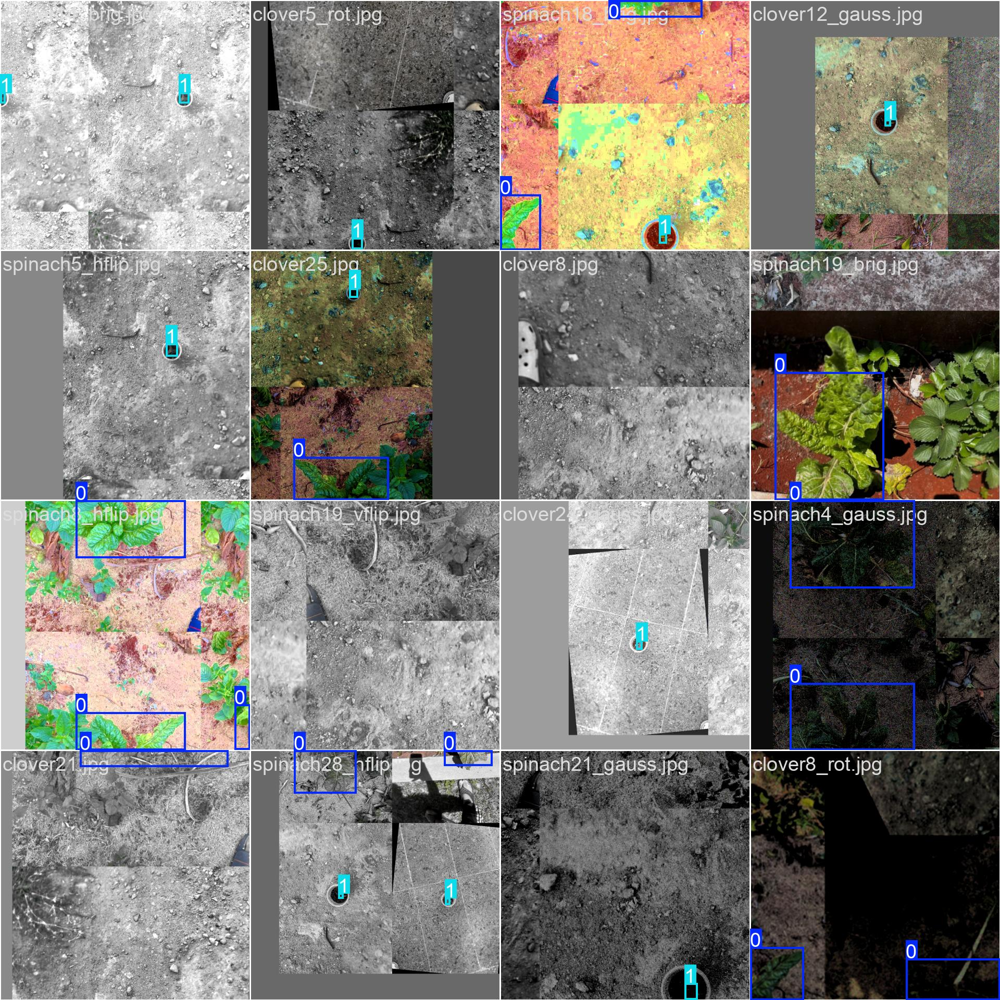

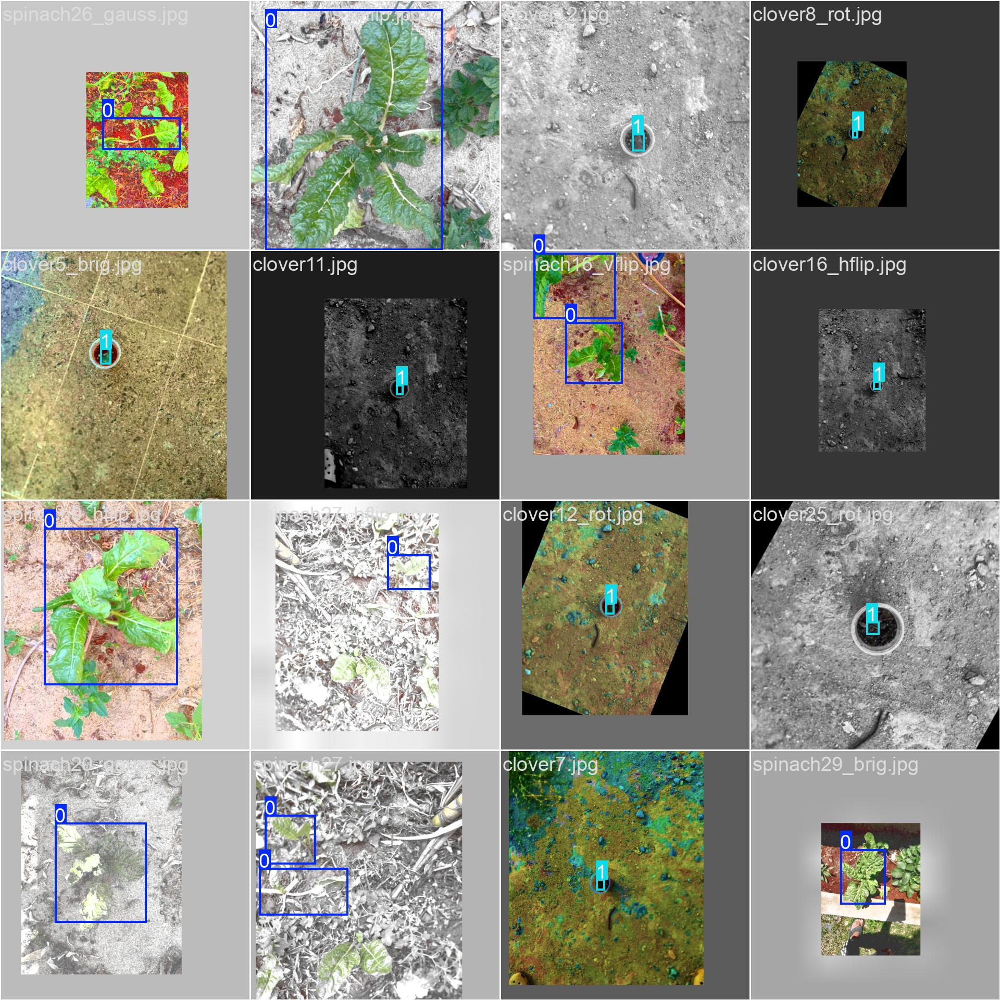

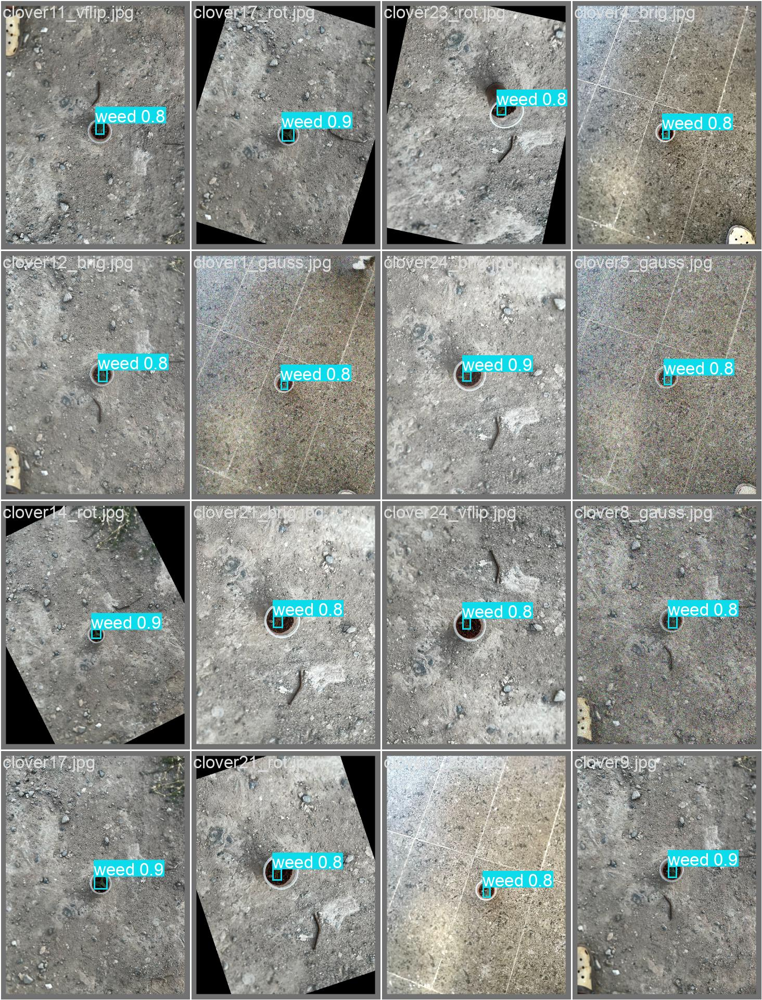

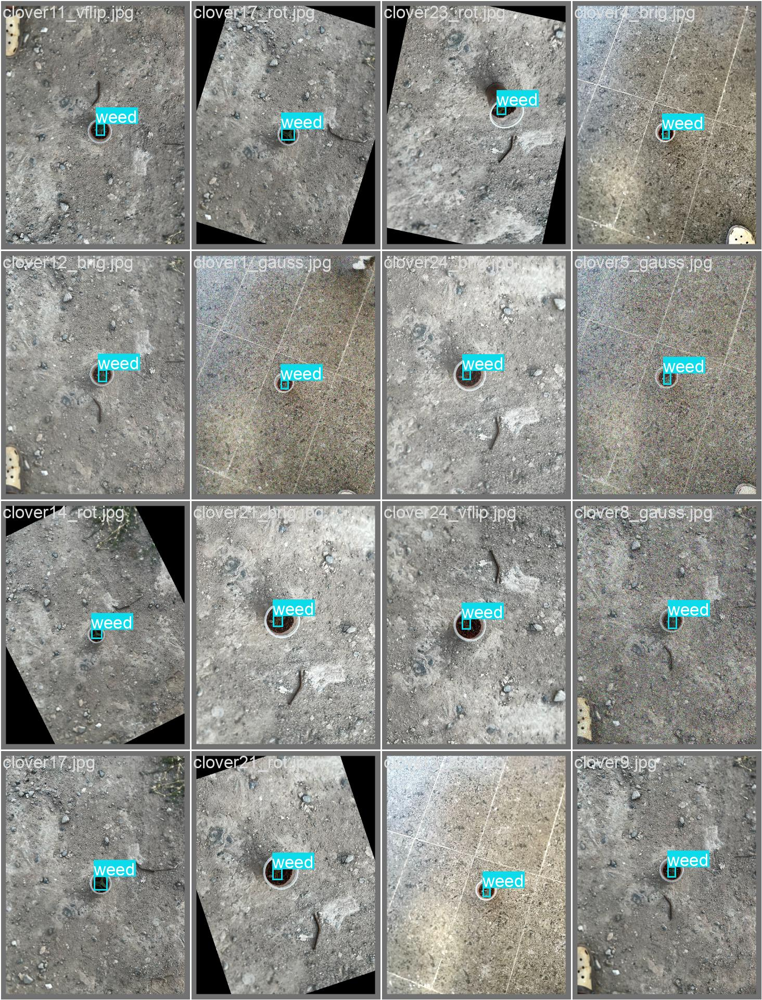

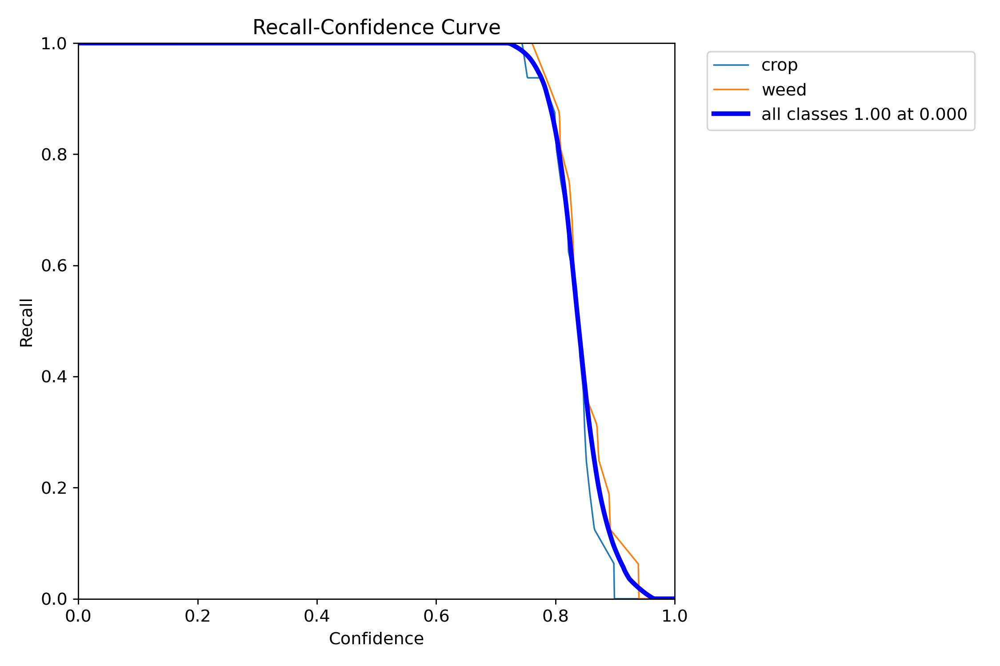

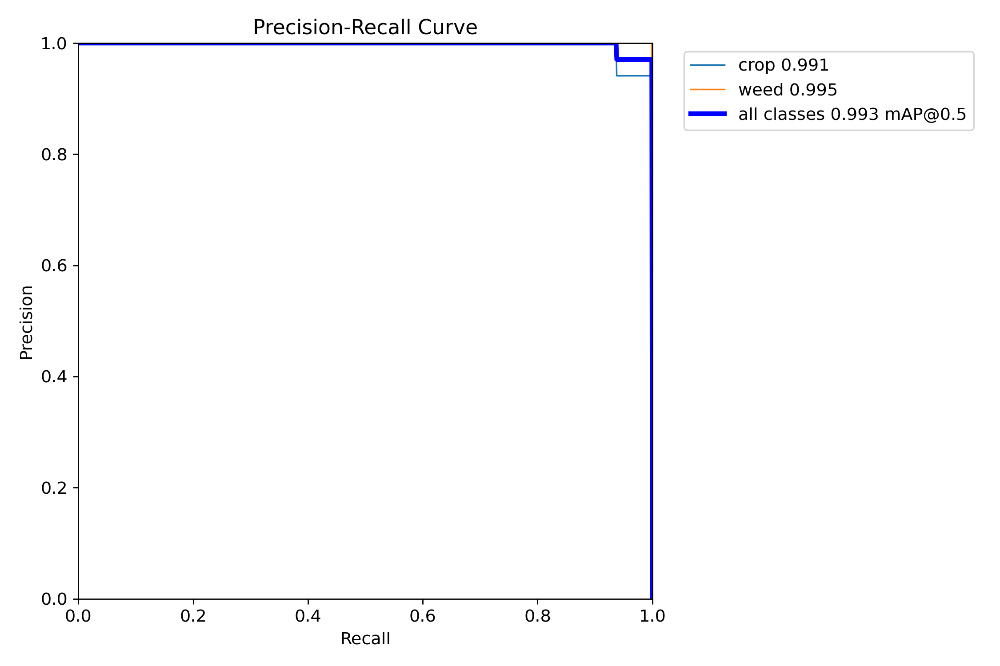

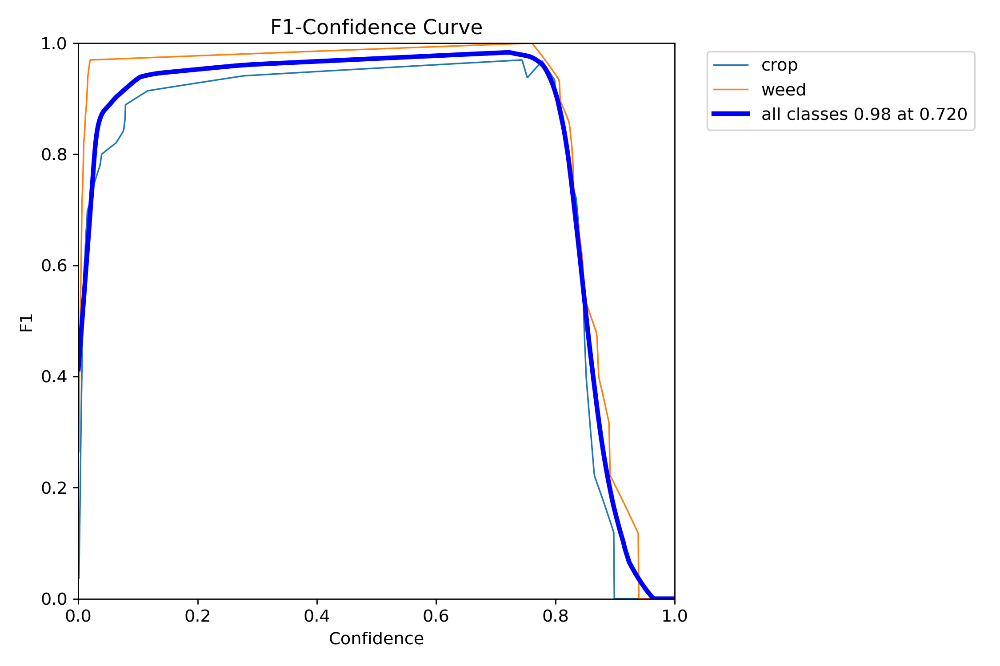

In [23]:
from IPython.display import display, Image

# Display an image from a file
display(Image(filename='/kaggle/working/runs/detect/train/confusion_matrix_normalized.png'))
display(Image(filename='/kaggle/working/runs/detect/train/results.png'))
display(Image(filename='/kaggle/working/runs/detect/train/train_batch1.jpg'))
display(Image(filename='/kaggle/working/runs/detect/train/train_batch751.jpg'))
display(Image(filename='/kaggle/working/runs/detect/train/val_batch0_pred.jpg'))
display(Image(filename='/kaggle/working/runs/detect/train/val_batch0_labels.jpg'))
display(Image(filename='/kaggle/working/runs/detect/train/R_curve.png'))
display(Image(filename='/kaggle/working/runs/detect/train/PR_curve.png'))
display(Image(filename='/kaggle/working/runs/detect/train/F1_curve.png'))



---
# Applying Model on House-Hold Crop


0: 640x480 2 crops, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 480)


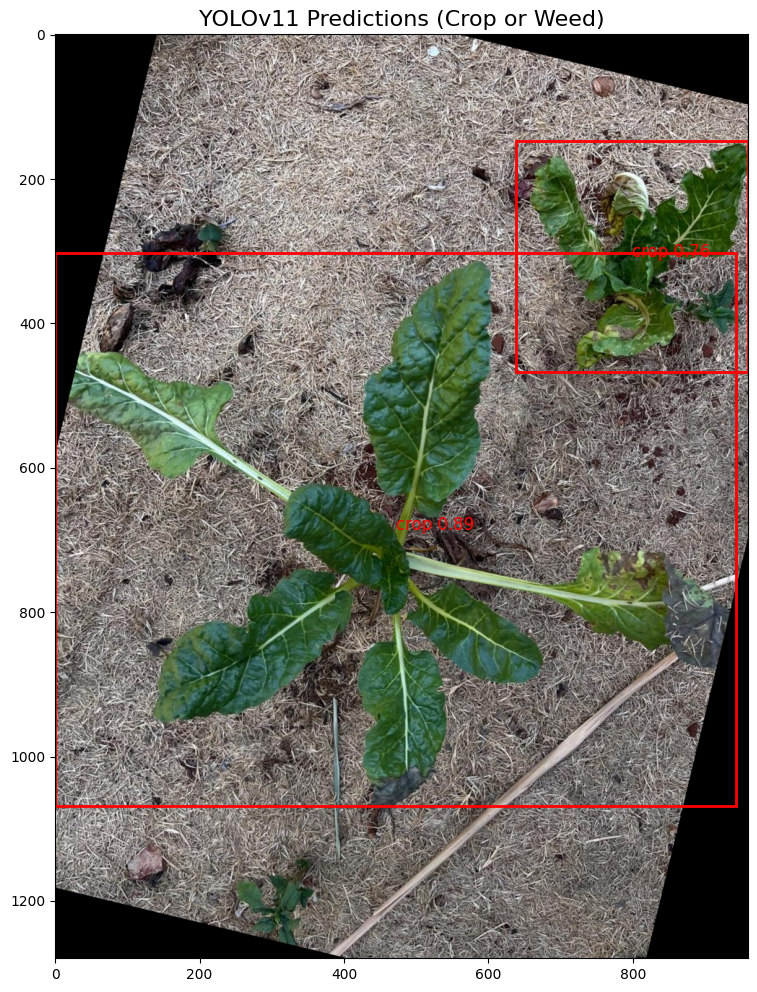

In [25]:
from ultralytics import YOLO
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the YOLO model
model_path = '/kaggle/working/runs/detect/train/weights/best.pt'  # Update this path to your model file
model = YOLO(model_path)  # Load YOLO model

# Set confidence threshold
threshold = 0.75

# Function to predict if the image is a weed or crop
def predict_image(image_path):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

    # Perform inference
    results = model(img, conf=threshold)  # Use the threshold for confidence

    # Access the first result
    result = results[0]

    # Extract the results (boxes, labels, and scores) and move tensors to CPU
    boxes = result.boxes.xywh.cpu().numpy()  # Convert to CPU and NumPy
    scores = result.boxes.conf.cpu().numpy()  # Convert to CPU and NumPy
    class_ids = result.boxes.cls.cpu().numpy().astype(int)  # Convert to CPU and NumPy
    labels = [result.names[i] for i in class_ids]  # Get class names

    # Visualize results
    fig, ax = plt.subplots(1, figsize=(12, 12))
    ax.imshow(img)

    for box, score, label in zip(boxes, scores, labels):
        if score >= threshold:  # Apply threshold filter
            x, y, w, h = box
            rect = plt.Rectangle((x - w/2, y - h/2), w, h, linewidth=2, edgecolor="red", facecolor="none")
            ax.add_patch(rect)
            ax.text(x, y, f"{label} {score:.2f}", color='red', fontsize=12)

    plt.title("YOLOv11 Predictions (Crop or Weed)", fontsize=16)
    plt.show()

# Example usage on a personal image
image_path = '/kaggle/working/agri_data_split/val/spinach15_rot.jpg'  # Update this with your image path
predict_image(image_path)



0: 640x480 1 weed, 10.2ms
Speed: 3.1ms preprocess, 10.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


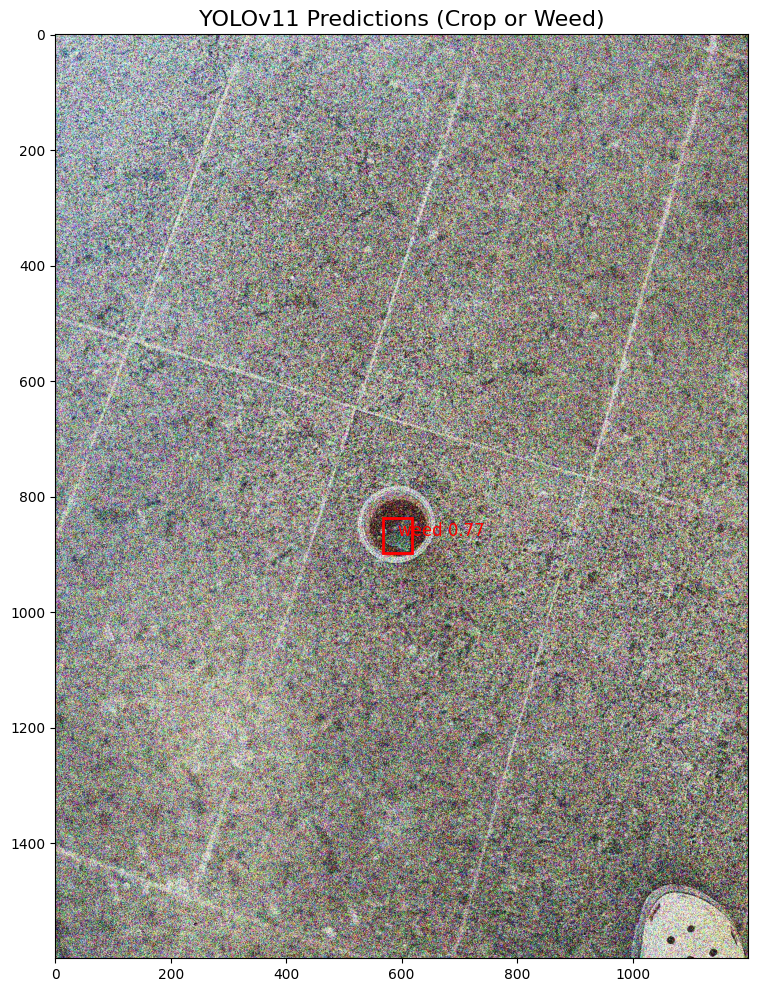

In [26]:
# Example usage on a personal image
image_path = '/kaggle/working/agri_data_split/test/clover4_gauss.jpg'  # Update this with your image path
predict_image(image_path)# sesame plant

# Recommendations

To improve the detection of weeds(Clover weeds) from crops(Spinach) in your YOLOv11 model, several strategies can be considered. 
- More images on the subjects we are to detect.
- Consult on overfitting aspect of the model
- Test YOLO Model 8 performance


In [27]:
! pip install ultralytics onnx onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 62.2 MB/s eta 0:00:00:00:01:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 7.4 MB/s eta 0:00:00


In [28]:
! yolo export model=/kaggle/working/runs/detect/train/weights/best.pt format=onnx


Ultralytics 8.3.79 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 100 layers, 2,582,542 parameters, 0 gradients, 6.3 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (5.2 MB)
requirements: Ultralytics requirement ['onnxslim'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 142.9/142.9 kB 6.6 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 3.7s, installed 1 package: ['onnxslim']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.48...
ONNX: export success ✅ 5.3s, saved as '/kaggle/working/runs/detect/train/weights/best.onnx' (10.1 MB)

Export complete (7.1s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=/kaggle/working/runs/detect/train/we